In [ ]:
!pip install datasets

In [ ]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 796.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 21.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=27596adcb1f4caeb058ab255043909cdb6575fdd92f8ab87fd8b929f87ec34c1
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
# Standard libraries
import os
import re
import string
import copy
import json
import random
import zipfile
import requests
import urllib.request
from pathlib import Path
from collections import Counter, defaultdict

# Data manipulation and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from IPython.display import display, HTML
from wordcloud import WordCloud

# Text processing
"""import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')"""

# Machine learning metrics
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
    confusion_matrix,
    precision_recall_curve,
    classification_report,
    auc
)
from sklearn.metrics import PrecisionRecallDisplay

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Hugging Face Transformers
from transformers import (
    AutoModelForSequenceClassification,
    TFAutoModelForSequenceClassification,
    AutoTokenizer,
    TrainingArguments,
    DataCollatorWithPadding,
    Trainer
)
from scipy.special import softmax

# Datasets
from datasets import Dataset

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
json_files = ["test.json", "training.json", "validation.json"]
dataframes = {}
for file_name in json_files:
    with open(file_name, "r") as file:
        data = json.load(file)
        dataframes[file_name] = pd.DataFrame(data)


# Load the original datasets from the specified JSON files into separate DataFrames
original_train_df = dataframes['training.json']
original_validation_df = dataframes['validation.json']
original_test_df = dataframes['test.json']

In [ ]:
def determine_majority(response_list):
    """
    Counts the occurrences of "YES" and "NO" in the input list and returns:
      - 1 if "YES" is the majority,
      - 0 if "NO" is the majority,
      - 2 if there is a tie.
    """
    yes_count = response_list.count("YES")
    no_count = response_list.count("NO")
    if yes_count > no_count:
        return 1
    elif no_count > yes_count:
        return 0
    else:
        return 2


def transform_df(df):
    """
    - Transposes the DataFrame.
    - Adds a column `hard_label_task1` based on the majority label in `labels_task1`.
    - Filters rows where `lang` is 'en' and excludes rows where `hard_label_task1` equals 2(tie).
    - Selects specific columns for the final output.
    """
    df = df.T
    df['hard_label_task1'] = df['labels_task1'].apply(determine_majority)
    df = df[df['lang'] == 'en']
    df = df[df['hard_label_task1'] != 2]
    df = df[['id_EXIST', 'lang', 'tweet', 'hard_label_task1']]
    return df


In [ ]:
# Apply the `transform_df` function to preprocess the training, validation, and test DataFrames
original_train_df = transform_df(original_train_df)
original_validation_df = transform_df(original_validation_df)
original_test_df = transform_df(original_test_df)

original_train_df

,id_EXIST,lang,tweet,hard_label_task1
200002,200002,en,Writing a uni essay in my local pub with a cof...,1
200003,200003,en,@UniversalORL it is 2021 not 1921. I dont appr...,1
200006,200006,en,According to a customer I have plenty of time ...,1
200007,200007,en,"So only 'blokes' drink beer? Sorry, but if you...",1
200008,200008,en,New to the shelves this week - looking forward...,0
...,...,...,...,...
203256,203256,en,idk why y’all bitches think having half your a...,1
203257,203257,en,This has been a part of an experiment with @Wo...,1
203258,203258,en,"""Take me already"" ""Not yet. You gotta be ready...",1
203259,203259,en,@clintneedcoffee why do you look like a whore?...,1


In [ ]:
# Create copies of the original datasets to avoid modifying them directly
train_df = original_train_df.copy()
validation_df = original_validation_df.copy()
test_df = original_test_df.copy()

In [ ]:
def clean_tweet(tweet):
    """
    Cleans a tweet by removing unwanted characters, URLs, hashtags, mentions
    """
    # Remove non-ASCII characters
    tweet = re.sub(r'[^\x00-\x7F]+', '', tweet)
    # Remove hashtags
    tweet = re.sub(r'#\w+', '', tweet)
    # Remove mentions
    tweet = re.sub(r'@\w+', '', tweet)
    # Remove URLs
    tweet = re.sub(r'http\S+|www\S+', '', tweet)
    # Remove non-alphanumeric characters (except spaces)
    tweet = re.sub(r'[^a-zA-Z0-9\s]', '', tweet)
    # Remove specific quote characters
    tweet = tweet.replace('“', '').replace('”', '').replace('‘', '').replace('’', '')
    # Convert to lowercase
    cleaned_tweet = tweet.lower()

    return cleaned_tweet

# Apply the `clean_tweet` function to the tweet column in the training, validation, and test datasets
train_df['tweet'] = train_df['tweet'].apply(clean_tweet)
validation_df['tweet'] = validation_df['tweet'].apply(clean_tweet)
test_df['tweet'] = test_df['tweet'].apply(clean_tweet)


In [ ]:
test_df.head()

,id_EXIST,lang,tweet,hard_label_task1
400178,400178,en,1st day at the pool on a beautiful sunday in n...,0
400179,400179,en,i like your outfit too except when i dress up ...,1
400180,400180,en,same though the angst just comes and goes lo...,0
400181,400181,en,fuck that cunt tried to vote her out multipl...,1
400182,400182,en,u gotta say some shit like ill fuck that cunt...,1


# Transformer

In [ ]:
# Define the task type (e.g., 'hate' for hate speech classification)
task = 'hate'
# Set the model name based on the task type
MODEL = f"cardiffnlp/twitter-roberta-base-{task}"
# Load the tokenizer for the specified model
tokenizer = AutoTokenizer.from_pretrained(MODEL)
# Load the pre-trained transformer model for sequence classification
transformer_model = AutoModelForSequenceClassification.from_pretrained(MODEL)#, output_attentions=True)
# Save the model to the local directory for future use
#transformer_model.save_pretrained(MODEL)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/700 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

In [ ]:
def preprocess_text(texts):
    # Use the tokenizer to process the 'tweet' column and apply truncation to handle long texts
    return tokenizer(texts['tweet'], truncation=True, padding=True)

# Convert the training, validation, and test dataframes into HuggingFace Dataset objects
train_data = Dataset.from_pandas(train_df)
validation_data = Dataset.from_pandas(validation_df)
test_data = Dataset.from_pandas(test_df)

# Apply the preprocessing function to the dataset, using the 'batched' option to process in batches
train_data = train_data.map(preprocess_text, batched=True)
validation_data = validation_data.map(preprocess_text, batched=True)
test_data = test_data.map(preprocess_text, batched=True)

# Show the processed training data
train_data

Map:   0%|          | 0/2870 [00:00<?, ? examples/s]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Map:   0%|          | 0/158 [00:00<?, ? examples/s]

Map:   0%|          | 0/286 [00:00<?, ? examples/s]

Dataset({
    features: ['id_EXIST', 'lang', 'tweet', 'hard_label_task1', '__index_level_0__', 'input_ids', 'attention_mask'],
    num_rows: 2870
})

In [ ]:
# Rename the label columns to match with transformer default
train_data = train_data.rename_column('hard_label_task1', 'label')
validation_data = validation_data.rename_column('hard_label_task1', 'label')
test_data = test_data.rename_column('hard_label_task1', 'label')

In [ ]:
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
transformer_training_args = TrainingArguments(
    output_dir="test_dir",
    learning_rate=1e-6,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    num_train_epochs=4,
    weight_decay=0.2,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    report_to='none'
)

In [ ]:
def compute_metrics(eval_pred):
    predictions, labels = eval_pred[0], eval_pred[1]
    predictions = np.argmax(predictions, axis=1)

    f1 = f1_score(y_true=labels, y_pred=predictions, average='macro')
    acc = accuracy_score(y_true=labels, y_pred=predictions)
    return {'f1': f1, 'acc': acc}


In [ ]:
transformer_trainer = Trainer(
    model=transformer_model,
    args=transformer_training_args,
    train_dataset=train_data,
    eval_dataset=validation_data,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

In [ ]:
transformer_trainer.train()
transformer_trainer.save_model("test_dir")

Epoch,Training Loss,Validation Loss,F1,Acc
1,0.451800,0.427071,0.823156,0.829114
2,0.424000,0.474559,0.849355,0.854430
3,0.432000,0.501425,0.849355,0.854430
4,0.442500,0.520295,0.855552,0.860759


In [ ]:
transformer_test_prediction_info = transformer_trainer.predict(test_data)

# Extract the model predictions and the true labels from the prediction result
transformer_test_predictions, transformer_test_labels = transformer_test_prediction_info.predictions, transformer_test_prediction_info.label_ids

In [ ]:
# Compute the evaluation metrics (such as F1 score and accuracy) for the test predictions
transformer_test_metrics = compute_metrics([transformer_test_predictions, transformer_test_labels])

# Extract the F1 score and accuracy from the computed metrics
transformer_f1 = transformer_test_metrics['f1']
transformer_accuracy = transformer_test_metrics['acc']

print(f"Accuracy on test: {transformer_accuracy:.4f}\nf1-score on test: {transformer_f1:.4f}", end="\n\n")

Accuracy on test: 0.8322
f1-score on test: 0.8310



# Explainability

### Attention Weights

In [ ]:
transformer_model = AutoModelForSequenceClassification.from_pretrained(
    "test_dir",
    output_attentions=True
)
transformer_model.eval()

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [ ]:
from bertviz import head_view
from transformers import AutoModel
import torch
import torch.nn.functional as F

# Choose device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Prepare input sentence
index = 25
text =  [token for token in test_data[index]['padded_tweet'] if token != "<PAD>"]
sentence = " ".join(text) # or just use your raw text directly

# Tokenize
inputs = tokenizer(sentence, return_tensors='pt').to(device)  # Move inputs to device
#print("Input tokens:", tokenizer.convert_ids_to_tokens(inputs['input_ids'][0]))

# Move model to device
transformer_model = transformer_model.to(device)
transformer_model.eval()

# Inference with no gradients
with torch.no_grad():
    outputs = transformer_model(**inputs)
    logits = outputs.logits         # [1, num_classes]
    attentions = outputs.attentions  # list: [layer1, ..., layerN]


probs = F.softmax(logits, dim=-1)      # Convert logits to probabilities
pred_class = torch.argmax(probs, dim=-1).item()
confidence = probs[0, pred_class].item()
id2label = {
    0: "non-sexist",
    1: "sexist"
}
label = id2label[pred_class]
print(f"Prediction: {label} (confidence: {confidence:.4f}), label: {id2label[test_df.iloc[index]['hard_label_task1']]}")

# Decode tokens
tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])
tokens = [token.replace('Ġ', '') for token in tokens]

# Visualize (assumes head_view handles CPU/GPU internally or takes CPU input)
head_view(attention=[att.cpu() for att in attentions], tokens=tokens)
"""
Using test_data[4]['padded_tweet']
5-Red-> seems to connect subject with refering to subject, that-cunt, you-remember, say-shit
0-Grey->each to themself
0-Acqua->each to next tooken
0-Orange->each to previous token
Layer 1 most attend start token
2-Pink -> each attend to himself, u attend to both you and also you,
2-Violet-> u and you attend to previous you
2-Grey-> EACH TOKEN ATTEN DTO THE PREVIOUS 3/4 TOKENS
4-Pink-> each token attend only to start and end
8-Violet->Cunt, Slut, Dumb have a lot of incoming edge
In the last layer most head are all-to-all and like 2or3 are all-to-start/end
"""

Prediction: sexist (confidence: 0.8509), label: sexist


<IPython.core.display.Javascript object>

"\nUsing test_data[4]['padded_tweet']\n5-Red-> seems to connect subject with refering to subject, that-cunt, you-remember, say-shit\n0-Grey->each to themself\n0-Acqua->each to next tooken\n0-Orange->each to previous token\nLayer 1 most attend start token\n2-Pink -> each attend to himself, u attend to both you and also you,\n2-Violet-> u and you attend to previous you\n2-Grey-> EACH TOKEN ATTEN DTO THE PREVIOUS 3/4 TOKENS\n4-Pink-> each token attend only to start and end\n8-Violet->Cunt, Slut, Dumb have a lot of incoming edge\nIn the last layer most head are all-to-all and like 2or3 are all-to-start/end\n"

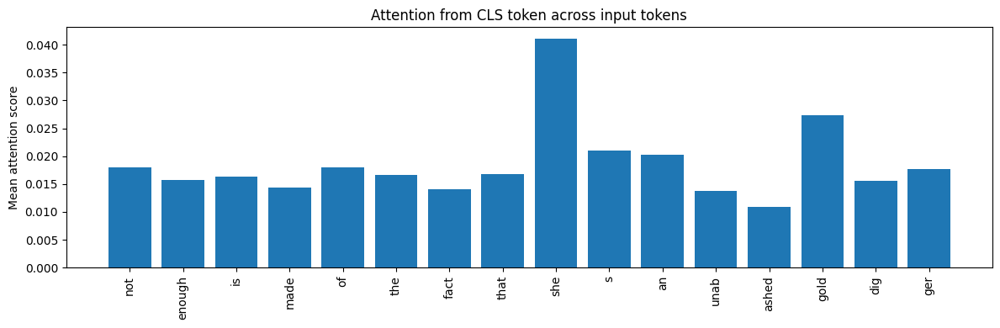

In [ ]:
# attention: Tensor of shape [layers, heads, seq_len, seq_len]
# Example: attention = torch.tensor(attention_data)
# Make sure it's a torch.Tensor
attentions_stacked = torch.stack(attentions).squeeze(1)
assert attentions_stacked.dim() == 4, "Expected [layers, heads, seq_len, seq_len]"

# Extract attention from CLS token (position 0) to others
# Shape: [layers, heads, target_tokens]
cls_attention = attentions_stacked[:, :, 0, :]  # attention FROM CLS to each token

# Average across layers and heads
cls_attention_mean = cls_attention.mean(dim=(0, 1))  # [seq_len]
tokens = [token.replace('Ġ', '') for token in tokens][1:-1]

plt.figure(figsize=(12, 4))
plt.bar(range(len(cls_attention_mean.cpu()[1:-1])), cls_attention_mean.cpu().numpy()[1:-1])
plt.xticks(range(len(tokens)), tokens, rotation=90)
plt.title("Attention from CLS token across input tokens")
plt.ylabel("Mean attention score")
plt.tight_layout()
plt.show()

In [ ]:
all_cls_attentions = torch.stack([att[:, :, 0, :] for att in attentions])
print(all_cls_attentions.shape)

mean_cls_attentions = all_cls_attentions.mean(dim=0).mean(dim=1)
mean_cls_attentions.shape
print(mean_cls_attentions)

torch.Size([12, 1, 12, 18])
tensor([[0.5017, 0.0180, 0.0157, 0.0163, 0.0143, 0.0180, 0.0166, 0.0141, 0.0168,
         0.0411, 0.0210, 0.0203, 0.0137, 0.0109, 0.0273, 0.0155, 0.0176, 0.2012]],
       device='cuda:0')


In [ ]:
test_data



Dataset({
    features: ['id_EXIST', 'lang', 'tweet', 'label', 'padded_tweet', '__index_level_0__', 'input_ids', 'attention_mask'],
    num_rows: 286
})

In [ ]:
from tqdm import tqdm
import torch
import torch.nn.functional as F
from datasets import concatenate_datasets


# These will store raw attention data for each class
all_attentions_sexist = []
all_input_ids_sexist = []

all_attentions_non_sexist = []
all_input_ids_non_sexist = []

# Phase 1: Forward pass & store attentions by predicted class
data = concatenate_datasets([validation_data, test_data])
for sample in tqdm(data):
    input_ids = torch.tensor([sample["input_ids"]]).to(device)
    attention_mask = torch.tensor([sample["attention_mask"]]).to(device)

    with torch.no_grad():
        outputs = transformer_model(input_ids=input_ids, attention_mask=attention_mask, output_attentions=True)
        logits = outputs.logits
        probs = F.softmax(logits, dim=-1)
        pred_class = torch.argmax(probs, dim=-1).item()

        attentions = [att.cpu() for att in outputs.attentions]  # list of (1, heads, seq_len, seq_len)

    if pred_class == 0:
        all_attentions_non_sexist.append(attentions)
        all_input_ids_non_sexist.append(sample["input_ids"])
    else:
        all_attentions_sexist.append(attentions)
        all_input_ids_sexist.append(sample["input_ids"])


# Utility to compute average token attention
def compute_avg_token_attention(all_attentions, all_input_ids):
    token_freq = defaultdict(int)
    token_attention_sum = defaultdict(float)

    for i in range(len(all_attentions)):
        attention_layers = torch.stack(all_attentions[i]).squeeze(1)  # shape: [num_layers, num_heads, seq_len, seq_len]

        """input_ids = all_input_ids[i]  # list of token ids
        # Get attention from CLS to all tokens: shape [layers, heads, seq_len]
        cls_attention = attention_layers[:, :, 0, :]
        # Average over layers and heads: shape [seq_len]
        avg_cls_attention = cls_attention.mean(dim=(0, 1))"""

        last_layer_attention = attention_layers[-1].squeeze(0)  # shape: [num_heads, seq_len, seq_len]
        input_ids = all_input_ids[i]  # list of token ids
        # Get attention from CLS to all tokens: shape [heads, seq_len]
        cls_attention = last_layer_attention[:, 0, :]  # heads x seq_len
        # Average over heads: shape [seq_len]
        avg_cls_attention = cls_attention.mean(dim=0)  # seq_len

        for token_id, att_score in zip(input_ids, avg_cls_attention):
            token_freq[token_id] += 1
            token_attention_sum[token_id] += float(att_score)

    # Final average
    token_avg_attention = {
        token_id: token_attention_sum[token_id] / token_freq[token_id]
        for token_id in token_freq
    }
    return token_avg_attention


# Phase 2: Compute attention stats for each group
token_avg_attention_non_sexist = compute_avg_token_attention(all_attentions_non_sexist, all_input_ids_non_sexist)
token_avg_attention_sexist = compute_avg_token_attention(all_attentions_sexist, all_input_ids_sexist)


100%|██████████| 444/444 [00:07<00:00, 58.33it/s]


In [ ]:
# Example: print top attended tokens in sexist predictions
top_tokens = sorted(token_avg_attention_sexist.items(), key=lambda x: -x[1])[:50]
for token_id, avg_score in top_tokens:
    print(tokenizer.decode([token_id]).replace(' ', ''), f"→ {avg_score:.4f}")

bald → 0.1310
they → 0.1209
que → 0.1207
bathing → 0.1112
you → 0.1100
took → 0.0993
gal → 0.0973
nails → 0.0963
school → 0.0954
skirt → 0.0947
room → 0.0939
anking → 0.0923
ush → 0.0883
misogyny → 0.0881
whore → 0.0864
woman → 0.0863
fem → 0.0863
calling → 0.0856
ulation → 0.0852
pop → 0.0829
arius → 0.0827
making → 0.0819
<s> → 0.0817
wall → 0.0814
</s> → 0.0814
testosterone → 0.0810
ches → 0.0809
feminism → 0.0800
went → 0.0798
bounce → 0.0798
maybe → 0.0797
forever → 0.0796
slut → 0.0791
hh → 0.0787
which → 0.0780
penis → 0.0760
summer → 0.0757
lesbian → 0.0753
aga → 0.0753
citizens → 0.0750
how → 0.0746
bag → 0.0745
females → 0.0745
boy → 0.0742
azi → 0.0731
economy → 0.0724
teachers → 0.0718
tease → 0.0715
days → 0.0713
prostitute → 0.0712


In [ ]:
# Example: print top attended tokens in sexist predictions
top_tokens = sorted(token_avg_attention_non_sexist.items(), key=lambda x: -x[1])[:50]
for token_id, avg_score in top_tokens:
    print(tokenizer.decode([token_id]), f"→ {avg_score:.4f}")

 witches → 0.2327
 tits → 0.1641
 sex → 0.1556
 congratulations → 0.1539
 blonde → 0.1468
 sexism → 0.1404
<s> → 0.1316
</s> → 0.1316
 stroke → 0.1268
 lady → 0.1161
 taxes → 0.1122
 harm → 0.1076
ika → 0.1054
ude → 0.1052
mith → 0.1037
 fascists → 0.1026
 question → 0.0990
 porn → 0.0979
 birds → 0.0941
 coins → 0.0938
 terrorists → 0.0935
 abuse → 0.0916
 cum → 0.0913
 air → 0.0908
 woman → 0.0862
 beard → 0.0832
 pregnancy → 0.0828
 choice → 0.0827
coins → 0.0817
 legs → 0.0815
 pee → 0.0813
 luck → 0.0810
 girls → 0.0808
 controlling → 0.0807
 masturb → 0.0801
life → 0.0793
 linebackers → 0.0791
 tire → 0.0788
 slap → 0.0787
 harassment → 0.0783
lad → 0.0781
 nails → 0.0781
 boys → 0.0780
 feminist → 0.0780
 consent → 0.0779
 misconduct → 0.0775
 guests → 0.0772
 al → 0.0768
 furry → 0.0766
 feminine → 0.0757


### LIME

In [ ]:
from lime.lime_text import LimeTextExplainer

label_map = {0: "non-sexist", 1: "sexist"}  # Customize if needed

def predict_proba(texts):
    """
    Generates probability predictions for text classification using a pre-trained model.
    """
    inputs = tokenizer(texts, padding=True, truncation=True, return_tensors="pt").to(model.device)
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1)
    return probs.cpu().numpy()

def explain_tweets_with_lime(tweets, explainer, predict_proba, num_features=10, num_samples=500, flg_batch_eval=False):
    """
    Generates LIME explanations for tweet classifications, showing which words influence the model's predictions.
    """
    feature_aggregate = defaultdict(lambda: defaultdict(float))  # class_label -> feature -> weight

    for i, tweet in enumerate(tweets):
        if not flg_batch_eval:
            print(f"\nExplaining tweet: {tweet}")

        exp = explainer.explain_instance(tweet, predict_proba, num_features=num_features, num_samples=num_samples, labels=[0, 1])

        # Get predicted class
        pred_class_idx = int(predict_proba([tweet])[0].argmax())
        class_label = label_map[pred_class_idx]

        # Extract explanation weights
        weights = dict(exp.as_list(label=pred_class_idx))

        if flg_batch_eval:
            # Aggregate weights per class
            for feature, weight in weights.items():
                feature_aggregate[class_label][feature] += weight
        else:
            fig = exp.as_pyplot_figure(label=pred_class_idx)
            fig.savefig(f"lime_explanation_{i}.png", dpi=300, bbox_inches='tight')
            exp.show_in_notebook()

        del exp
        del weights
        torch.cuda.empty_cache()

    if flg_batch_eval:
        # Plot separate bar chart for each class
        for class_label, weights_dict in feature_aggregate.items():
            top_features = sorted(weights_dict.items(), key=lambda x: abs(x[1]), reverse=True)[:20]
            features, weights = zip(*top_features)
            colors = ['red' if w > 0 else 'green' for w in weights]

            plt.figure(figsize=(8, 6))
            plt.barh(features, weights, color=colors)
            plt.xlabel('Total Weight')
            plt.title(f'Top 20 Aggregated LIME Feature Importance ({class_label})')
            plt.axvline(0, color='black', linewidth=0.8)
            plt.tight_layout()
            plt.show()

        return {class_label: dict(weights) for class_label, weights in feature_aggregate.items()}
    else:
        return None



Explaining tweet:  please not the ones talking to 1st and 2nd  graders about gender identity



Explaining tweet: 23chapter 1 getting inside my headchapter 2 on theorieschapter 3 the metanarrative of christianitychapter 4 argument of entitieschapter 5 argument from personal experiencechapter 6 human freedomchapter 7 gods providence



Explaining tweet:    yup i hate when men rape and kill women 



Explaining tweet: aughhh i still got an exam tomorrow i hate women


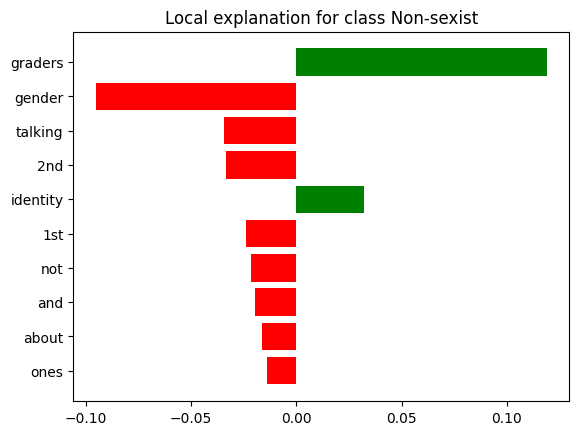

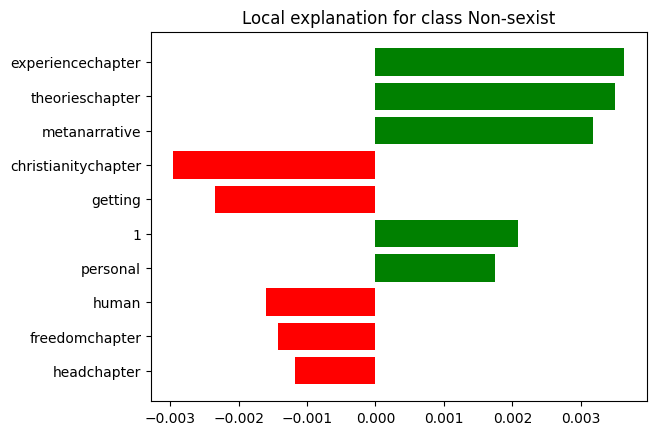

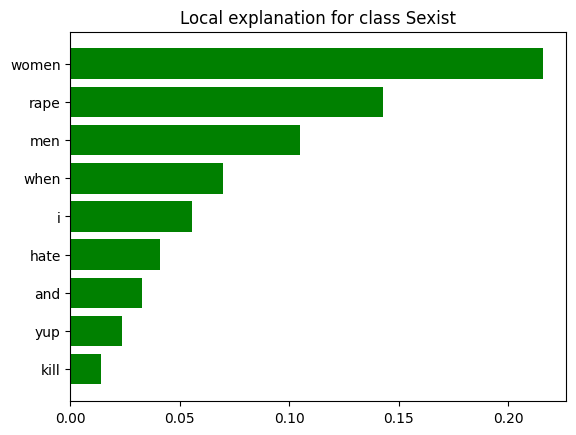

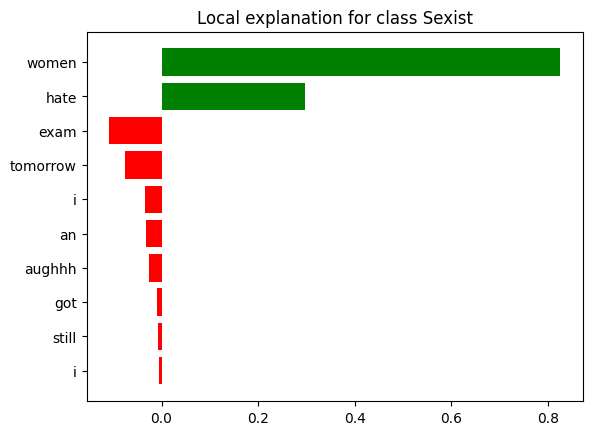

In [ ]:
tweets = []
for i in [12, 78, 56, 46]:
  tweets.append(test_data[i]['tweet'])

model = transformer_trainer.model
class_names = ['Non-sexist', 'Sexist']

explainer = LimeTextExplainer(class_names=class_names, bow=False)

feature_weights = explain_tweets_with_lime(tweets, explainer, predict_proba)

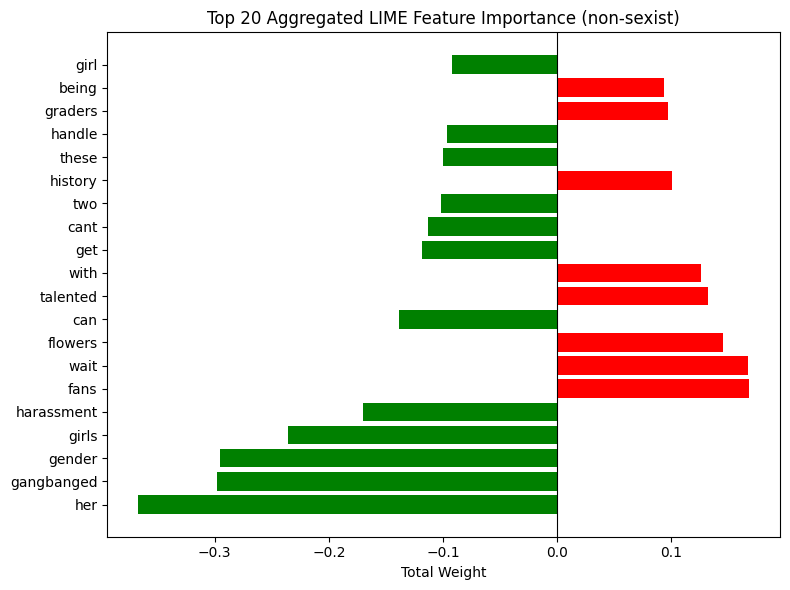

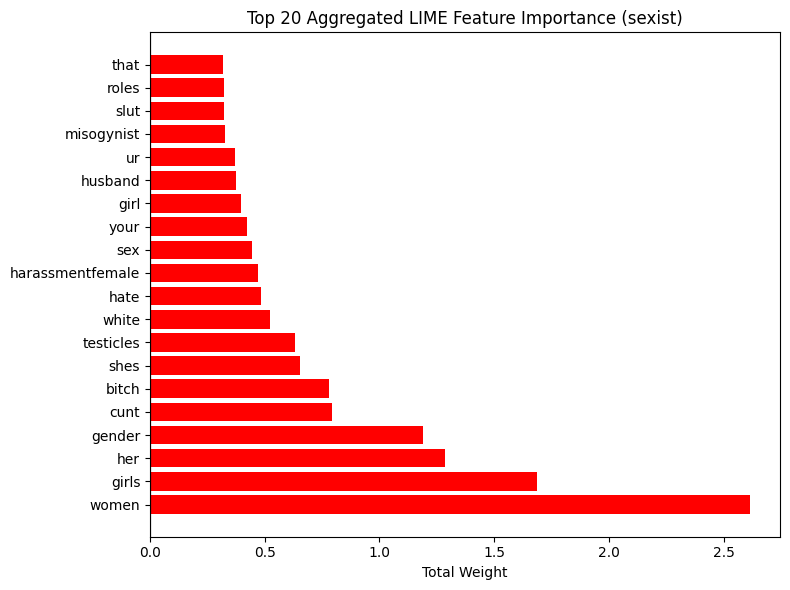

In [ ]:
tweets = []
for i in range(0, 50):
  tweets.append(test_data[i]['tweet'])

feature_weights = explain_tweets_with_lime(tweets, explainer, predict_proba, flg_batch_eval=True)

### SHAP

In [ ]:
pip install shap

In [ ]:
import torch
import numpy as np
import re
import shap

def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=128, truncation=True)
        for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = transformer_model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T  # softmax
    val = np.log(scores)  # LOG PROBABILITY
    return val

def custom_tokenizer(s, return_offsets_mapping=True):
    """Tokenizza il testo dividendo per caratteri non alfanumerici."""
    pos = 0
    offset_ranges = []
    input_ids = []
    for m in re.finditer(r"\W", s):
        start, end = m.span(0)
        offset_ranges.append((pos, start))
        input_ids.append(s[pos:start])
        pos = end
    if pos != len(s):
        offset_ranges.append((pos, len(s)))
        input_ids.append(s[pos:])
    out = {
        "input_ids": input_ids,
    }
    if return_offsets_mapping:
        out["offset_mapping"] = offset_ranges
    return out

masker = shap.maskers.Text(custom_tokenizer)
tweets = []
for i in [12, 78, 56, 46]:
    tweets.append(test_data[i]['tweet'])

output_names = ['Non-sexist', 'Sexist']
explainer = shap.Explainer(f, masker, output_names=output_names)
shap_values = explainer(tweets)

# classification probability
probs = np.exp(f(tweets))

for i, tweet in enumerate(tweets):
    print(f"\nTweet #{i+1}: {tweet}")
    print("Prediction probabilities:")
    for cls, p in zip(output_names, probs[i]):
        print(f"  {cls}: {p:.2f}")
    shap.plots.text(shap_values[i])

PartitionExplainer explainer: 5it [00:16,  4.03s/it]


Tweet #1:  please not the ones talking to 1st and 2nd  graders about gender identity
Prediction probabilities:
  Non-sexist: 0.98
  Sexist: 0.02



Tweet #2: 23chapter 1 getting inside my headchapter 2 on theorieschapter 3 the metanarrative of christianitychapter 4 argument of entitieschapter 5 argument from personal experiencechapter 6 human freedomchapter 7 gods providence
Prediction probabilities:
  Non-sexist: 0.99
  Sexist: 0.01



Tweet #3:    yup i hate when men rape and kill women 
Prediction probabilities:
  Non-sexist: 0.09
  Sexist: 0.91



Tweet #4: aughhh i still got an exam tomorrow i hate women
Prediction probabilities:
  Non-sexist: 0.05
  Sexist: 0.95


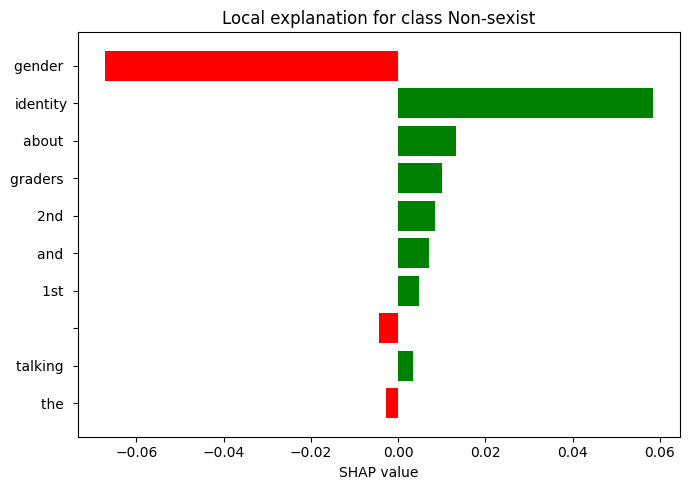

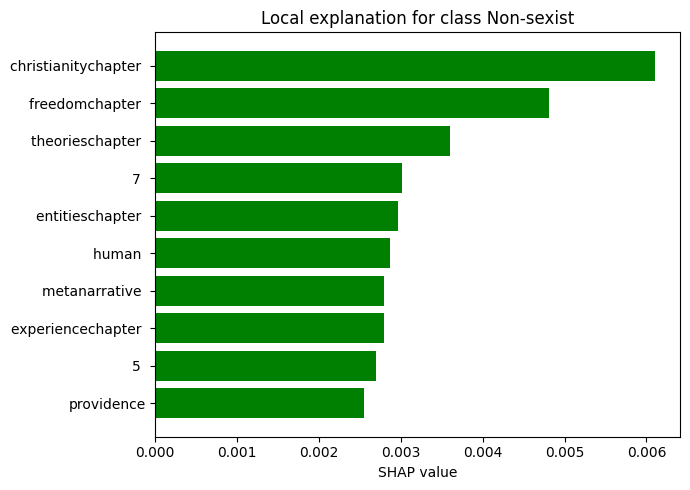

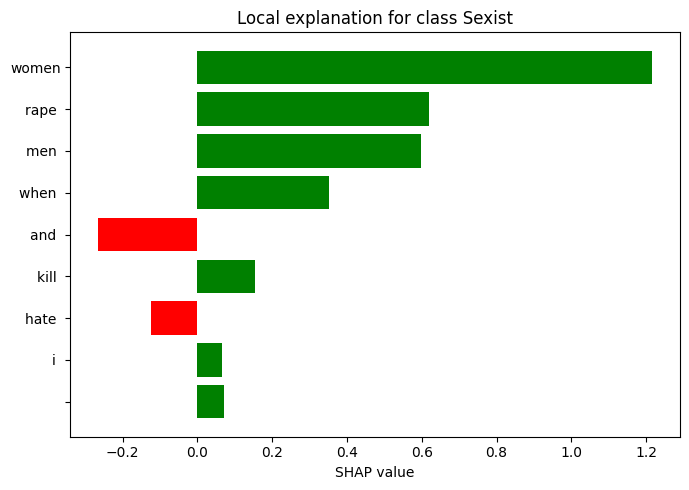

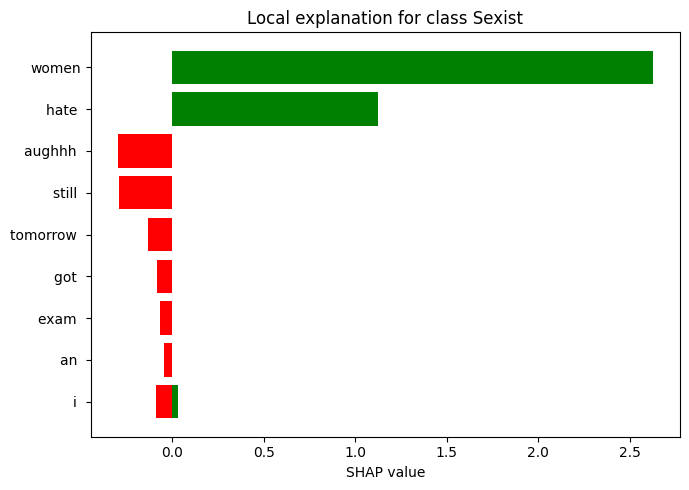

In [ ]:
import matplotlib.pyplot as plt

# Funzione per ottenere la classe predetta
def get_predicted_class(probs_row):
    return np.argmax(probs_row)

# Per ogni tweet analizzato
for i, tweet in enumerate(tweets):
    pred_class_idx = get_predicted_class(probs[i])  # indice della classe predetta
    pred_class_label = output_names[pred_class_idx]

    # Ottieni valori SHAP e token
    shap_vals = shap_values[i].values[:, pred_class_idx]  # valori SHAP per la classe predetta
    tokens = shap_values[i].data

    # Associa token e valore SHAP e ordina per importanza assoluta
    token_shap_pairs = list(zip(tokens, shap_vals))
    token_shap_pairs.sort(key=lambda x: abs(x[1]), reverse=True)

    # Prendi i top 10 token
    top_tokens, top_shap = zip(*token_shap_pairs[:10])

    # Plot
    plt.figure(figsize=(7, 5))
    colors = ['green' if val > 0 else 'red' for val in top_shap]
    plt.barh(top_tokens[::-1], top_shap[::-1], color=colors[::-1])
    plt.xlabel("SHAP value")
    plt.title(f"Local explanation for class {pred_class_label}")
    #plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
tweets = []
for i in range(0, 50):
  tweets.append(test_data[i]['tweet'])

# Calcola i valori SHAP
shap_values = explainer(tweets)

# Calcola anche le probabilità di classificazione (valori softmax)
probs = np.exp(f(tweets))  # restituisce probabilità vere

# Mostra i risultati per ogni tweet
for i, tweet in enumerate(tweets):
    print(f"\nTweet #{i+1}: {tweet}")
    print("Prediction probabilities:")
    for cls, p in zip(output_names, probs[i]):
        print(f"  {cls}: {p:.2f}")
    shap.plots.text(shap_values[i])

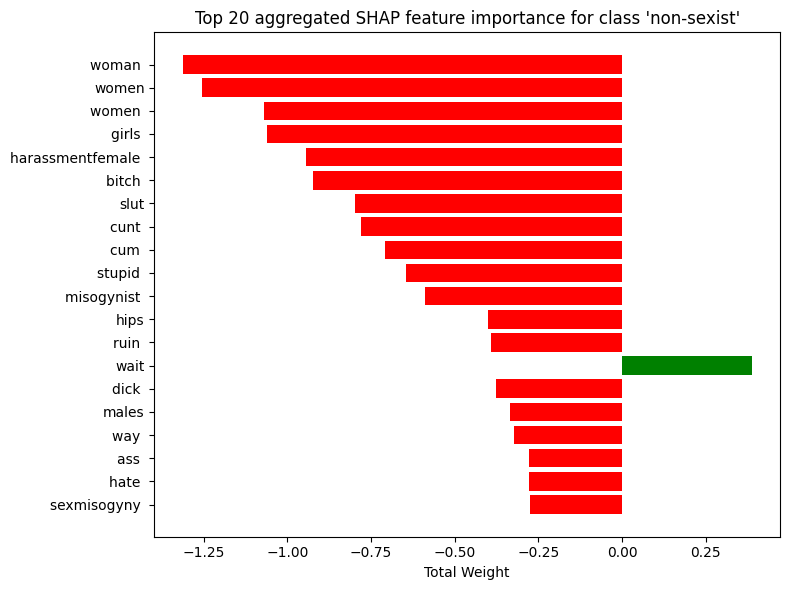

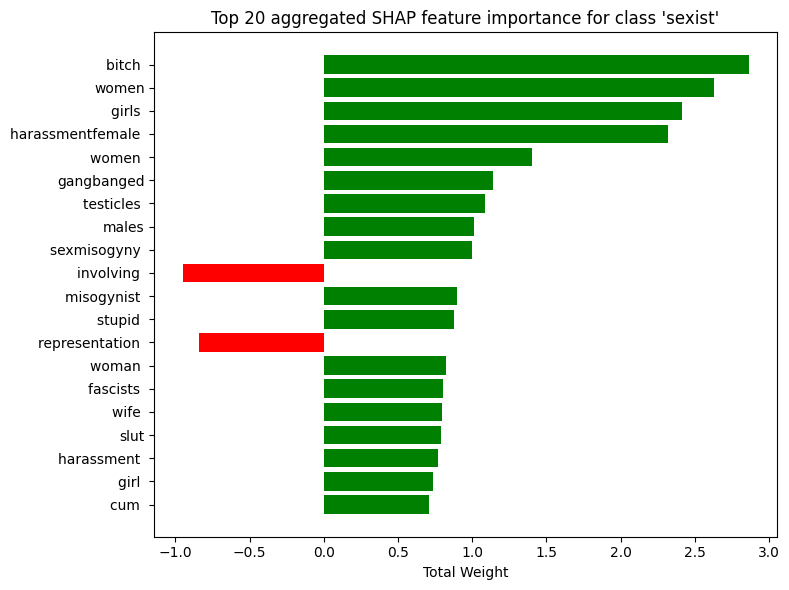

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict, Counter

# Normalizza i nomi delle classi a minuscolo
output_names = [name.lower() for name in output_names]

# Inizializza dizionari per sommare i valori SHAP e contare le occorrenze per ciascun token
shap_token_sums = {
    'sexist': defaultdict(float),
    'non-sexist': defaultdict(float)
}
shap_token_counts = {
    'sexist': defaultdict(int),
    'non-sexist': defaultdict(int)
}

# Analizza tutti i tweet
for i in range(len(tweets)):
    for class_idx, class_label in enumerate(output_names):
        shap_vals = shap_values[i].values[:, class_idx]  # valori SHAP per la classe
        tokens = shap_values[i].data

        for token, val in zip(tokens, shap_vals):
            shap_token_sums[class_label][token] += val
            shap_token_counts[class_label][token] += 1

# Calcola la media dei valori SHAP per ciascun token
shap_token_means = {
    class_label: {
        token: shap_token_sums[class_label][token] / shap_token_counts[class_label][token]
        for token in shap_token_sums[class_label]
    }
    for class_label in output_names
}

# Funzione per il plotting
def plot_top_tokens(token_means, class_label):
    # Prendi i 20 token con valore SHAP medio assoluto più alto
    top_tokens = sorted(token_means.items(), key=lambda x: abs(x[1]), reverse=True)[:20]
    tokens, means = zip(*top_tokens)

    colors = ['green' if val > 0 else 'red' for val in means]

    plt.figure(figsize=(8, 6))
    plt.barh(tokens[::-1], means[::-1], color=colors[::-1])
    plt.xlabel("Total Weight")
    plt.title(f"Top 20 aggregated SHAP feature importance for class '{class_label}'")
    plt.tight_layout()
    plt.show()

# Plot per ciascuna classe
for class_label in output_names:
    plot_top_tokens(shap_token_means[class_label], class_label)


